#### Load the data

In [26]:
import pandas as pd

df = pd.read_json('datasets/stupidstuff.json')
df = df[df['category'] != 'Miscellaneous']
df

,body,category,id,rating
0,A blackjack dealer and a player with a thirtee...,Children,1,2.63
1,"At a dinner party, several of the guests were ...",Blonde Jokes,2,2.57
2,One day this cop pulls over a blonde for speed...,Blonde Jokes,3,3.09
3,Three women are about to be executed for crime...,Blonde Jokes,4,4.10
4,A girl came skipping home FROM school one day....,Blonde Jokes,5,4.30
...,...,...,...,...
3653,,Religious,3654,3.00
3654,"At an interfaith retreat some time ago, the or...",Religious,3655,3.00
3655,,Religious,3656,2.00
3656,We have all learned to live with voice mail as...,Religious,3657,3.00


#### See if there are any missing, null or duplicated rows are in the data

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2942 entries, 0 to 3657
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   body      2942 non-null   object 
 1   category  2942 non-null   object 
 2   id        2942 non-null   int64  
 3   rating    2942 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 114.9+ KB


In [28]:
df.isna().sum()

body        0
category    0
id          0
rating      0
dtype: int64

In [29]:
df.duplicated().sum()

0

#### Bar plot for displaying the data distribution

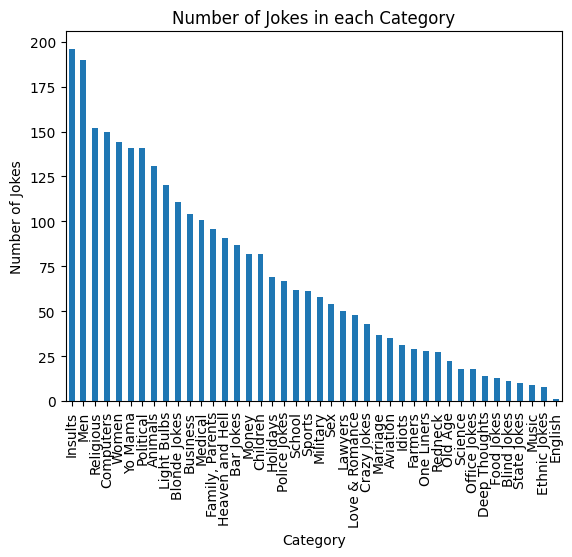

In [30]:
import matplotlib.pyplot as plt

# Count the number of jokes in each category
counts = df.category.value_counts()

# Create a bar chart
counts.plot(kind='bar')
plt.title('Number of Jokes in each Category')
plt.xlabel('Category')
plt.ylabel('Number of Jokes')

# Show the plot
plt.show()

#### Let's remove the stop words and clean up the joke texts

In [31]:
# Import the libraries

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import re
import string

In [32]:
# Download the stopwords

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Error loading stopwords: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1123)>
[nltk_data] Error loading wordnet: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1123)>
[nltk_data] Error loading punkt: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1123)>


False

In [33]:
STOPWORDS = stopwords.words()
LEMMATIZER = WordNetLemmatizer()
STEMMER = PorterStemmer()

# Define a function to clean the text
def clean_text(text):
    # Remove the punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Remove digits
    text = text.translate(str.maketrans('', '', string.digits))
    # Convert the text to lowercase
    text = text.lower()
    
    # Tokenize the text
    text_tokens = word_tokenize(text) 
    # Remove the stopwords
    tokens_without_sw = [word for word in text_tokens if not word in STOPWORDS]
    # Lemmatize the words
    text_cleaned = [LEMMATIZER.lemmatize(word) for word in tokens_without_sw]
    # Stem the words
    text_cleaned = [STEMMER.stem(word) for word in text_cleaned]
    
    # Join the words back into a string
    text_cleaned = (' ').join(text_cleaned)

    return text_cleaned

In [34]:
# Clean the text
df['joke_cleaned'] = df['body'].apply(clean_text)
df

,body,category,id,rating,joke_cleaned
0,A blackjack dealer and a player with a thirtee...,Children,1,2.63,blackjack dealer player thirteen count hand ar...
1,"At a dinner party, several of the guests were ...",Blonde Jokes,2,2.57,dinner parti guest argu woman trustworthi woma...
2,One day this cop pulls over a blonde for speed...,Blonde Jokes,3,3.09,day cop pull blond speed cop car ask blond lic...
3,Three women are about to be executed for crime...,Blonde Jokes,4,4.10,woman execut crime brunett redhead blondetwo g...
4,A girl came skipping home FROM school one day....,Blonde Jokes,5,4.30,girl skip home school day mommi mommi yell cou...
...,...,...,...,...,...
3653,,Religious,3654,3.00,
3654,"At an interfaith retreat some time ago, the or...",Religious,3655,3.00,interfaith retreat time ago organ decid free a...
3655,,Religious,3656,2.00,
3656,We have all learned to live with voice mail as...,Religious,3657,3.00,learn live voic mail part modern life wonder g...


In [35]:
df.category.unique()

array(['Children', 'Blonde Jokes', 'Military', 'Office Jokes', 'Aviation',
       'Political', 'Deep Thoughts', 'Men', 'Crazy Jokes', 'Medical',
       'Food Jokes', 'Bar Jokes', 'Science', 'Police Jokes', 'Sex',
       'Idiots', 'Business', 'Women', 'Redneck', 'One Liners', 'Money',
       'School', 'Family, Parents', 'Sports', 'Heaven and Hell',
       'Religious', 'Farmers', 'Love & Romance', 'Blind Jokes',
       'Marriage', 'Old Age', 'Animals', 'Holidays', 'Ethnic Jokes',
       'State Jokes', 'English', 'Computers', 'Lawyers', 'Yo Mama',
       'Insults', 'Light Bulbs', 'Music'], dtype=object)

#### See wordclouds for each category

In [36]:
from wordcloud import WordCloud

# Define a function to plot the wordcloud
def plot_wordcloud(text, title=None):
    # Create a WordCloud object
    wc = WordCloud(width=800, height=500, random_state=42, max_font_size=110)
    # Generate the wordcloud
    wc.generate(text)
    
    # Plot the wordcloud
    plt.figure(figsize=(10, 8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

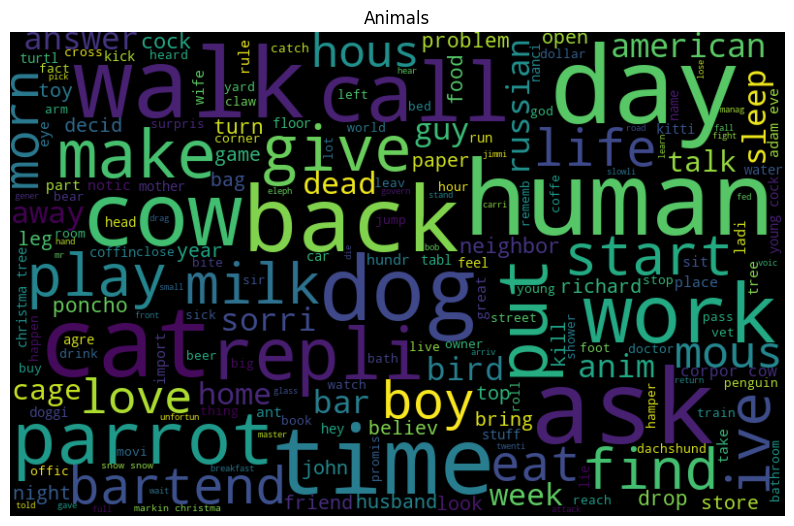

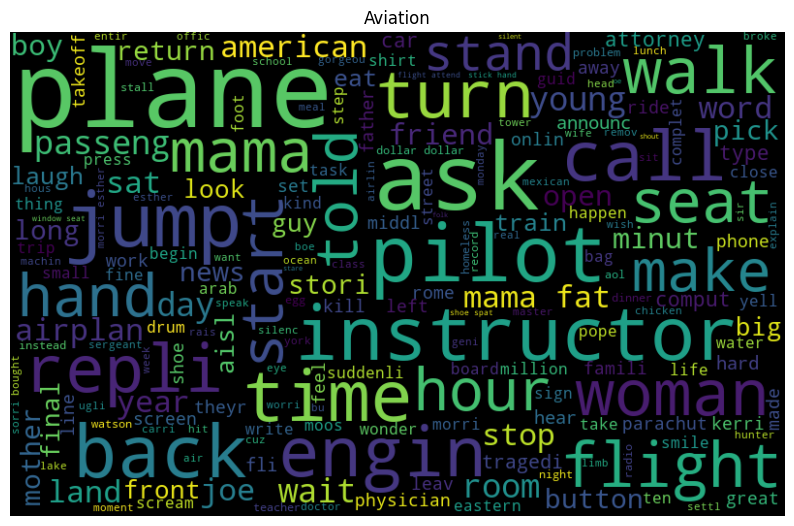

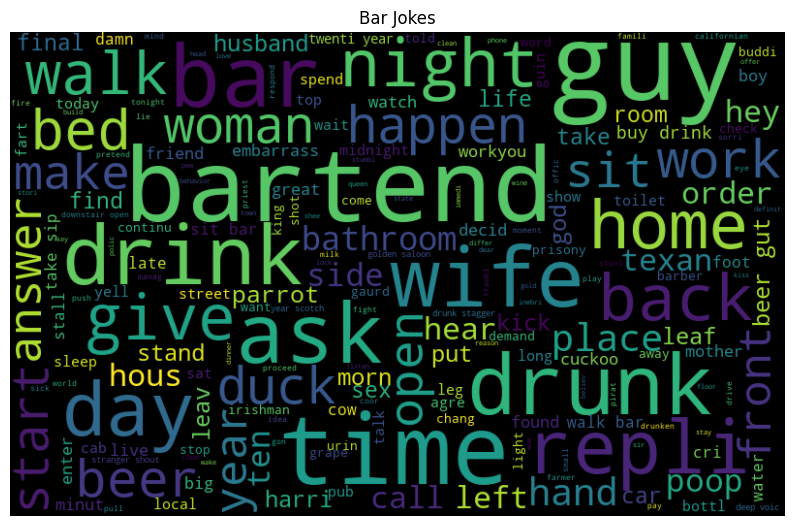

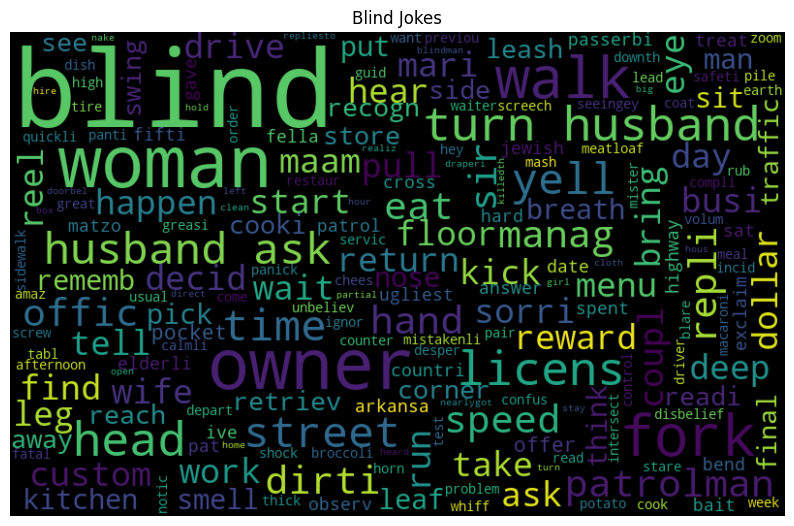

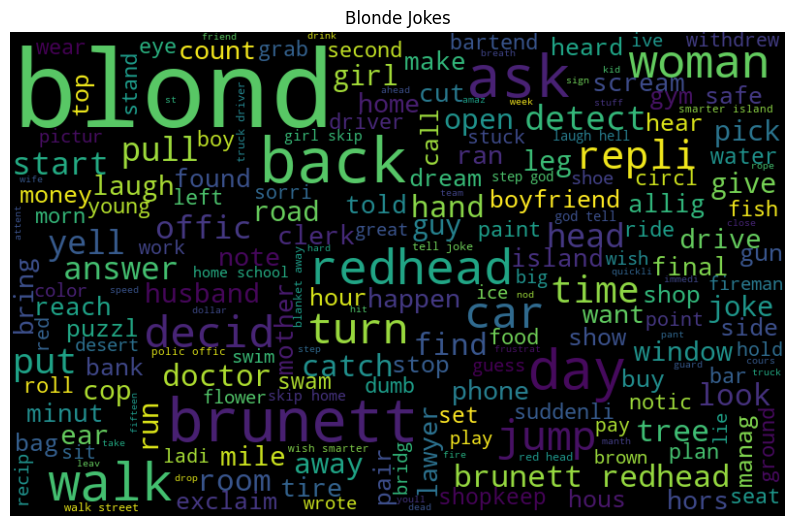

...

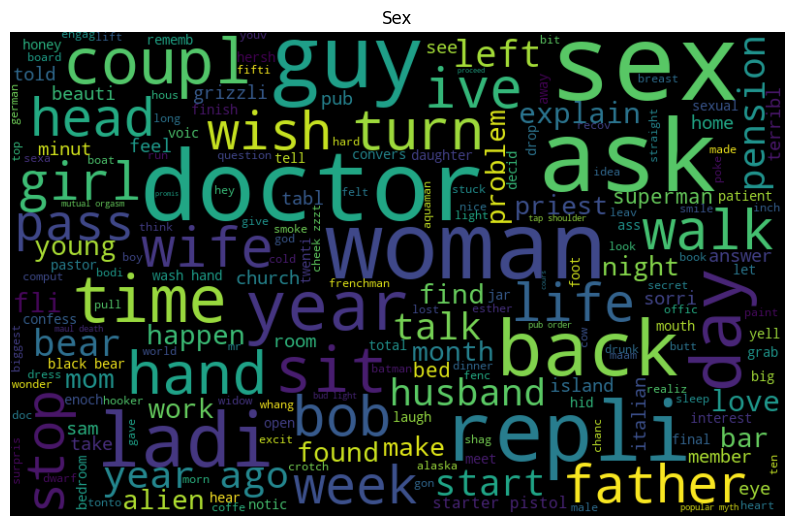

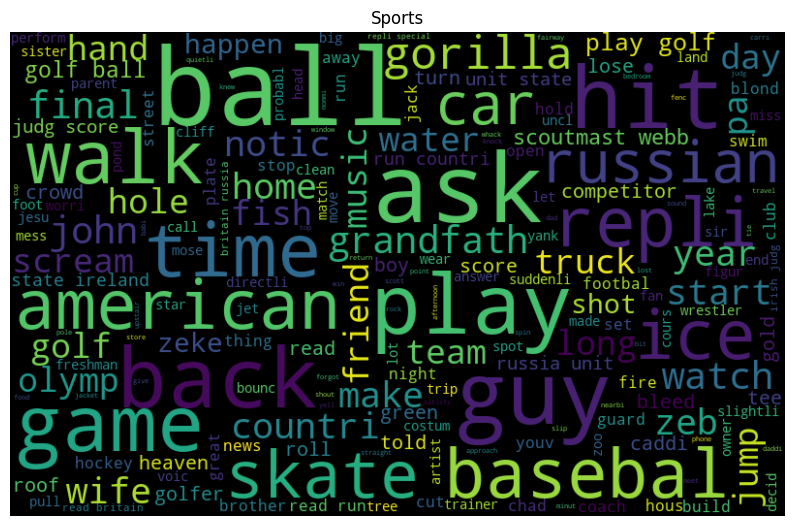

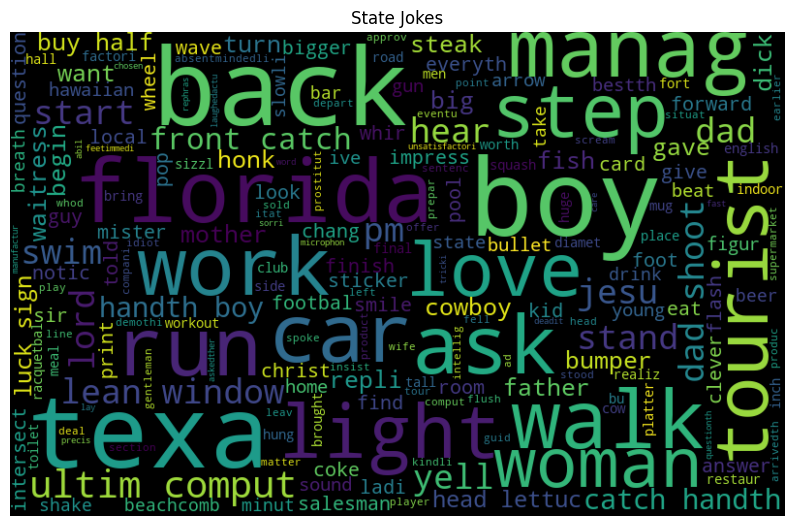

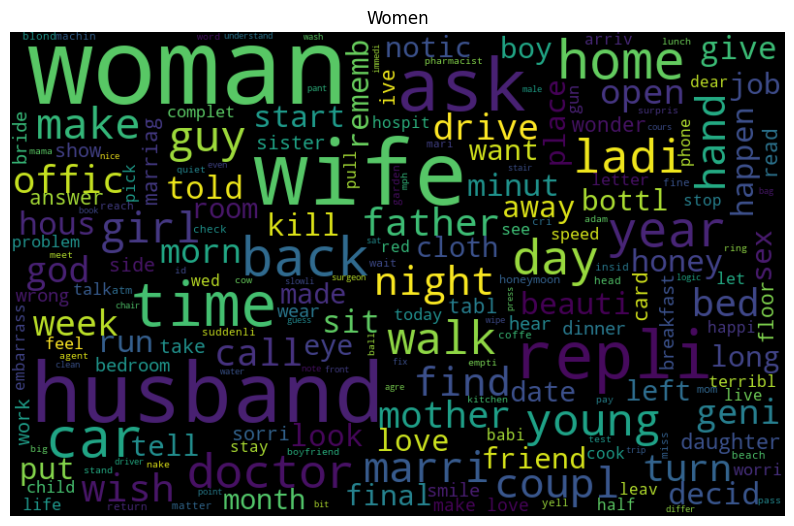

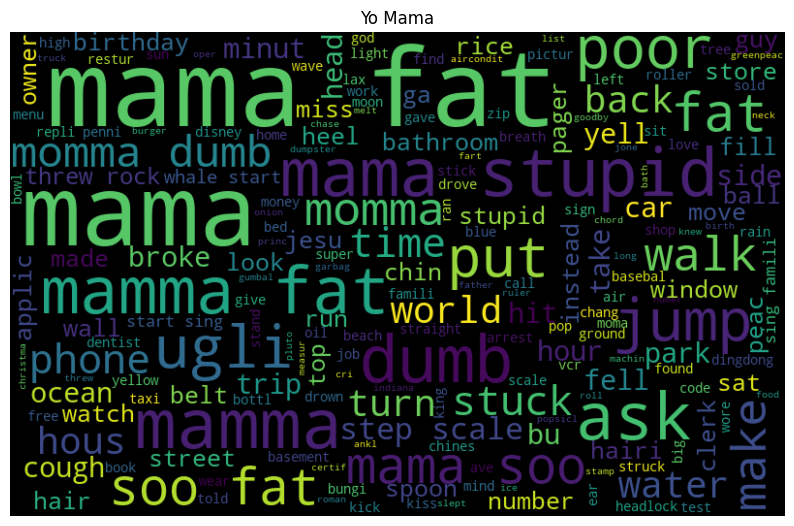

In [37]:
# Group the jokes by category
grouped_df = df.groupby('category')

# Plot the wordcloud for each category
for category, data in grouped_df: 
    text = ' '.join(data['joke_cleaned'])
    plot_wordcloud(text, category)

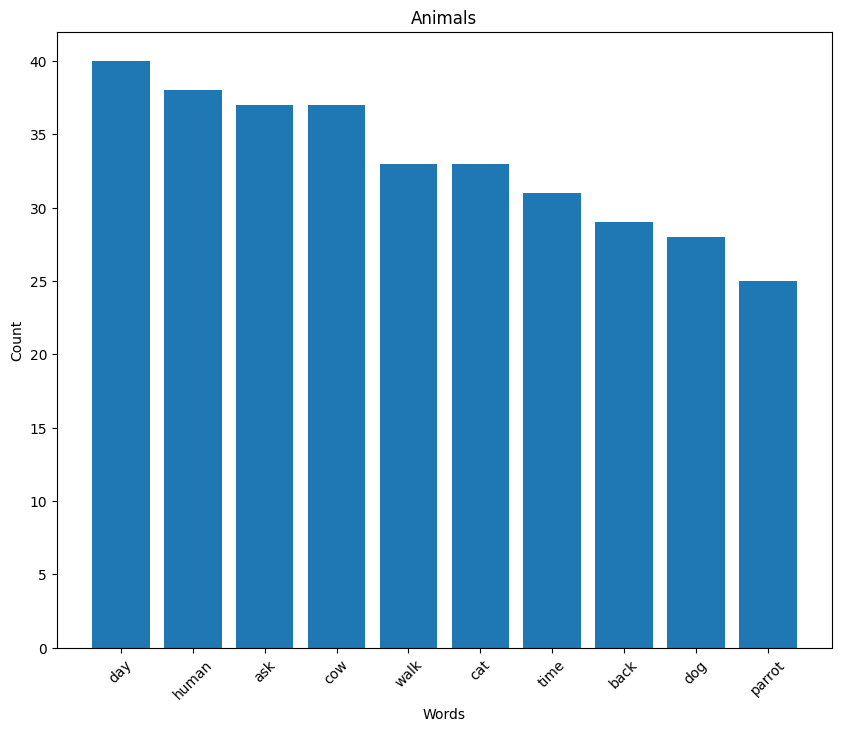

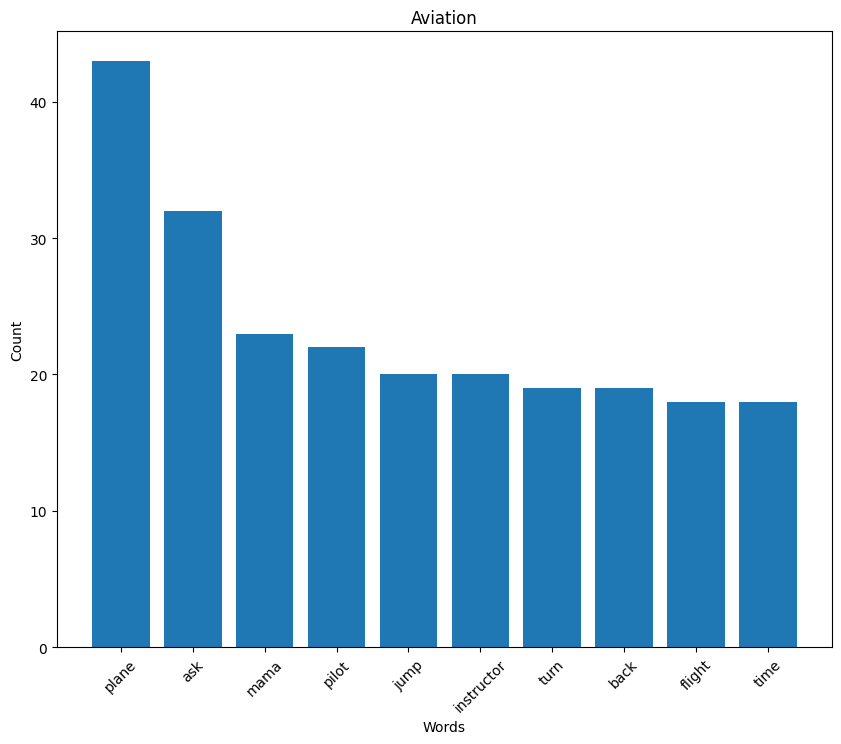

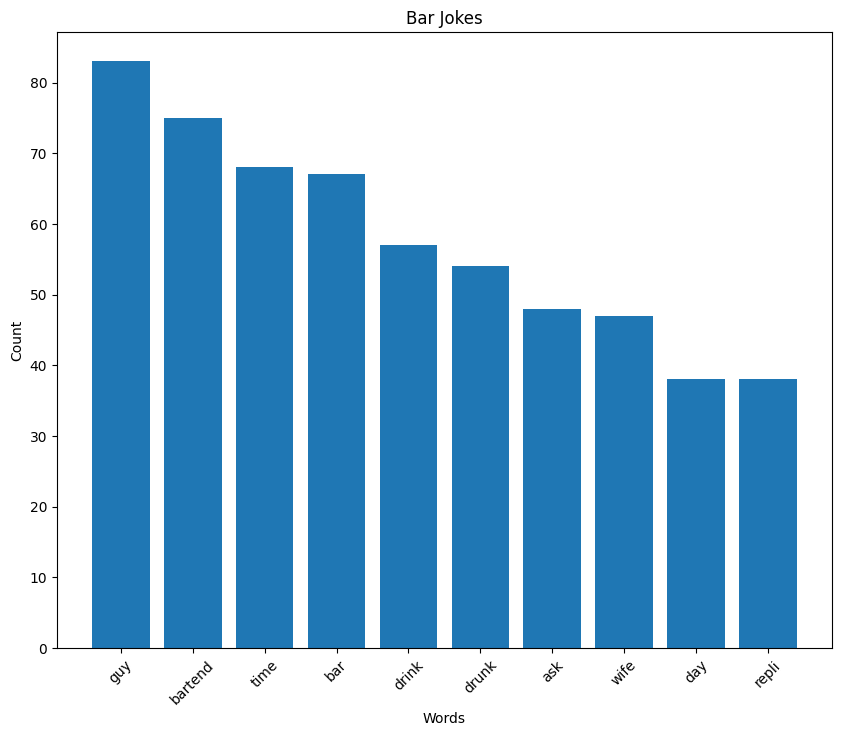

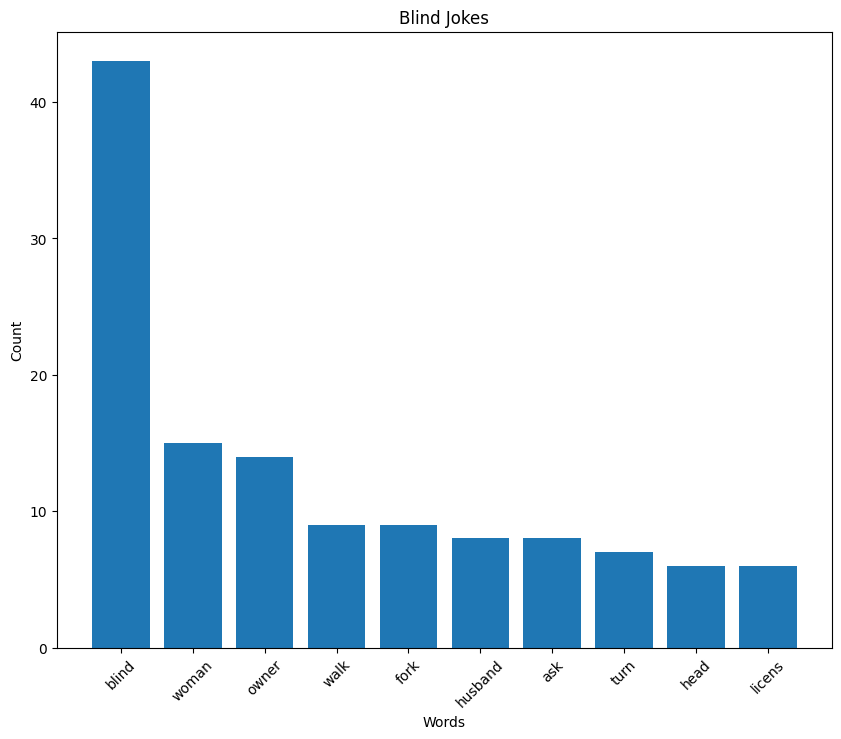

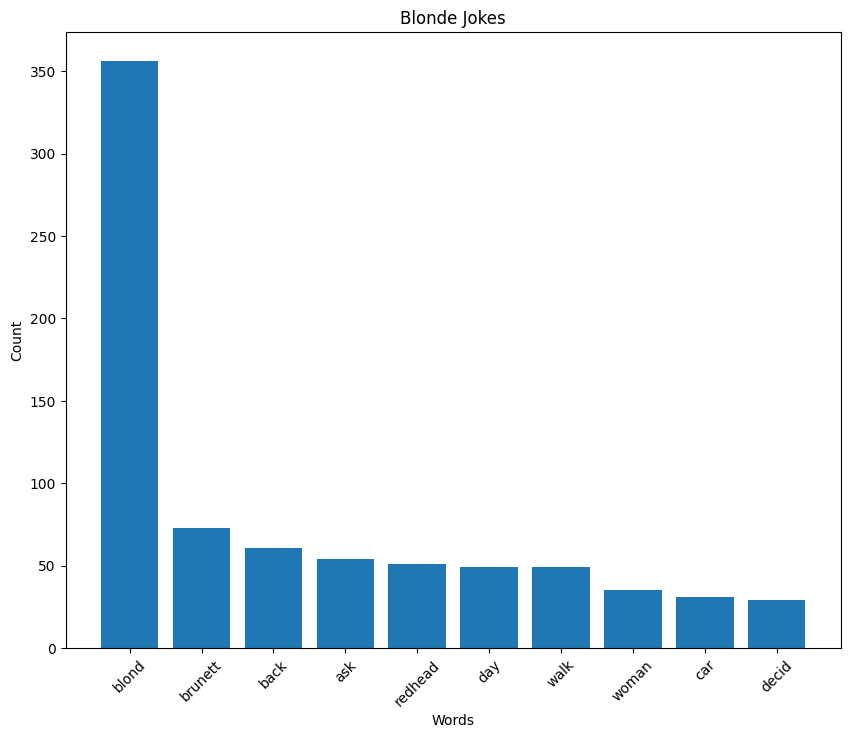

...

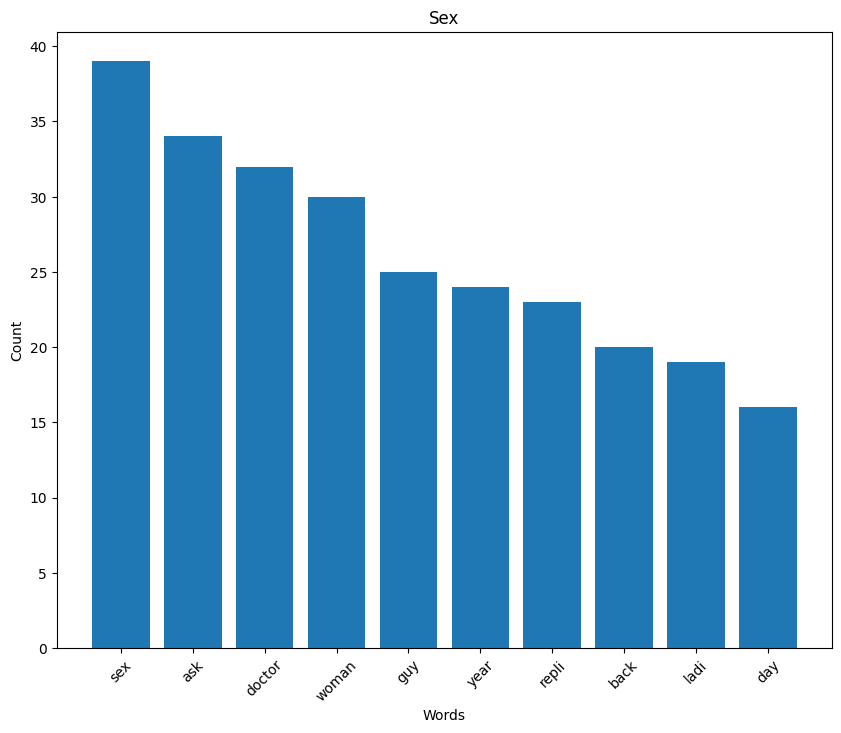

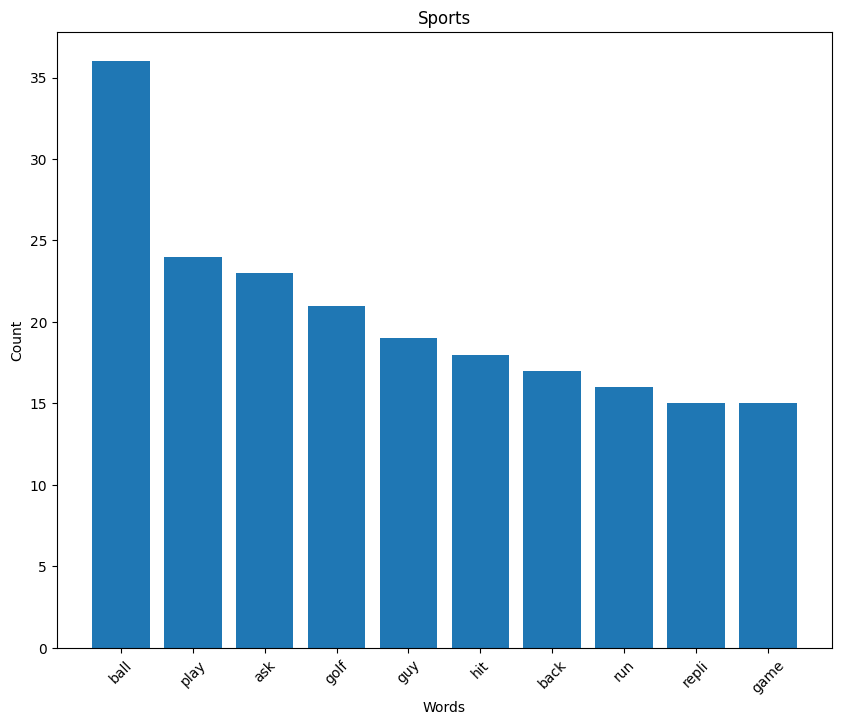

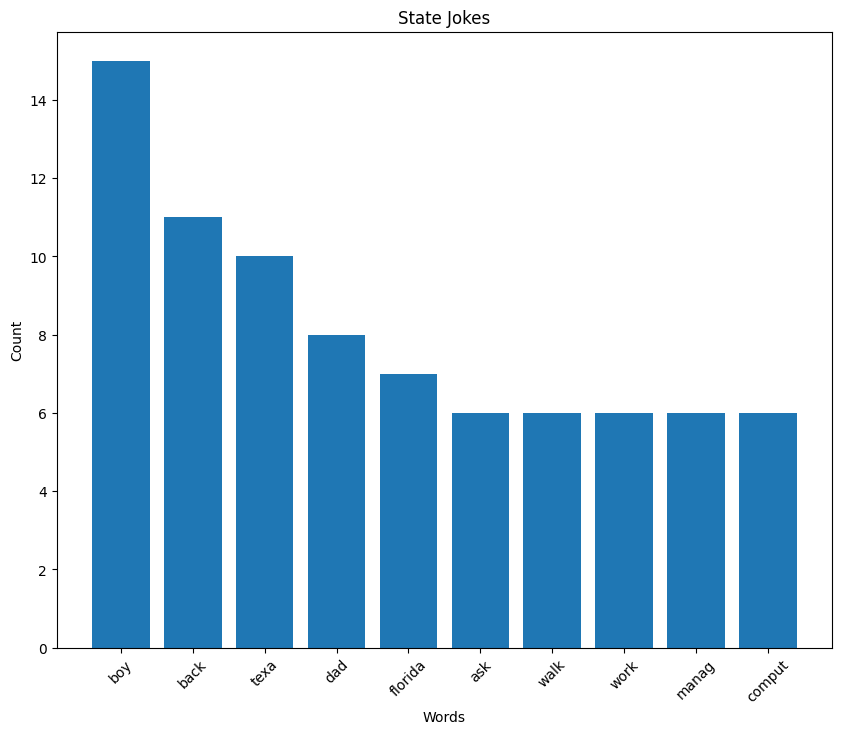

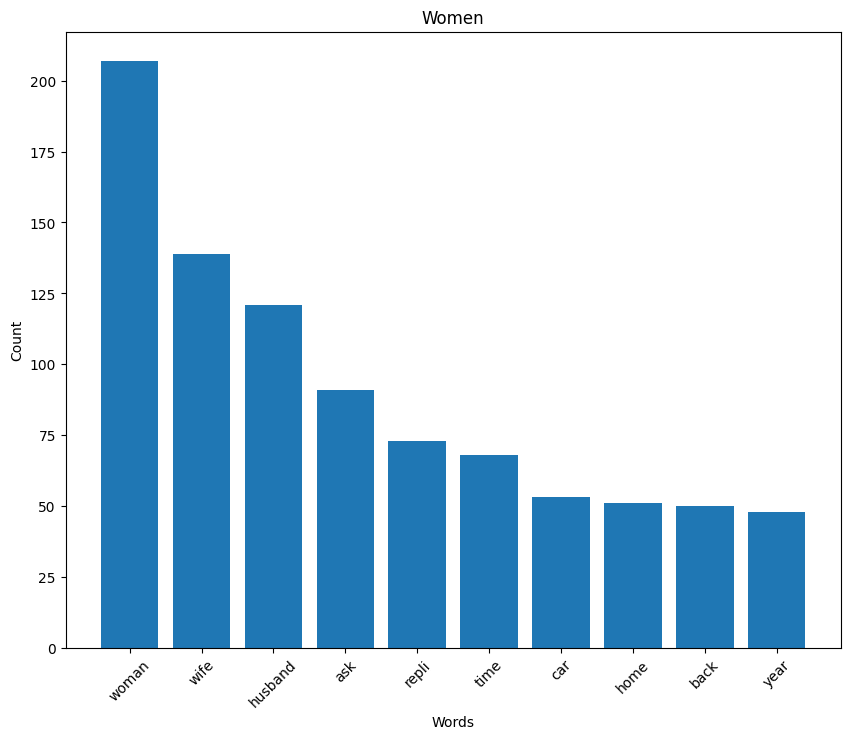

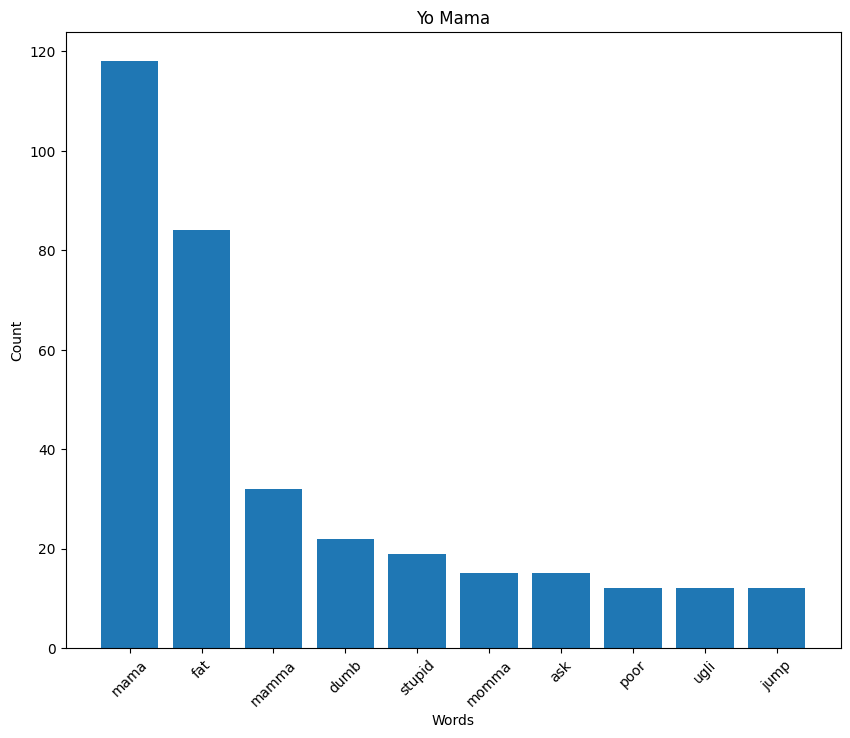

In [38]:
# Plot the top 10 most frequent words in each category
for category, data in grouped_df:
    text = ' '.join(data['joke_cleaned'])
    # Tokenize the text
    text_tokens = word_tokenize(text) 
    # Create a frequency distribution
    fdist = nltk.FreqDist(text_tokens)
    # Get the top 10 most frequent words
    top_10 = fdist.most_common(10)
    # Convert the top 10 most frequent words into a dictionary
    top_10_dict = dict(top_10)
    # Plot the top 10 most frequent words
    plt.figure(figsize=(10, 8))
    plt.bar(top_10_dict.keys(), top_10_dict.values())
    plt.title(category)
    plt.xlabel('Words')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

#### Prepare the data for modeling

In [67]:
# Create a new dataframe with only the jokes and the categories
new_df = df[['joke_cleaned', 'category']]
new_df

,joke_cleaned,category
0,blackjack dealer player thirteen count hand ar...,Children
1,dinner parti guest argu woman trustworthi woma...,Blonde Jokes
2,day cop pull blond speed cop car ask blond lic...,Blonde Jokes
3,woman execut crime brunett redhead blondetwo g...,Blonde Jokes
4,girl skip home school day mommi mommi yell cou...,Blonde Jokes
...,...,...
3653,,Religious
3654,interfaith retreat time ago organ decid free a...,Religious
3655,,Religious
3656,learn live voic mail part modern life wonder g...,Religious


In [70]:
# Label encode the categories
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
new_df['category_labels'] = le.fit_transform(new_df['category'])
new_df

/var/folders/5w/tqssmhcs6f74m3q3w4wm1g7w0000gn/T/ipykernel_28588/3987680657.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['category_labels'] = le.fit_transform(new_df['category'])


,joke_cleaned,category,category_labels
0,blackjack dealer player thirteen count hand ar...,Children,6
1,dinner parti guest argu woman trustworthi woma...,Blonde Jokes,4
2,day cop pull blond speed cop car ask blond lic...,Blonde Jokes,4
3,woman execut crime brunett redhead blondetwo g...,Blonde Jokes,4
4,girl skip home school day mommi mommi yell cou...,Blonde Jokes,4
...,...,...,...
3653,,Religious,34
3654,interfaith retreat time ago organ decid free a...,Religious,34
3655,,Religious,34
3656,learn live voic mail part modern life wonder g...,Religious,34


#### Split the data into training and testing sets

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(new_df['joke_cleaned'], new_df['category'], test_size=0.2, random_state=42)


#### Bag of words

In [71]:
from sklearn.feature_extraction.text import CountVectorizer

# Create a CountVectorizer object
CV = CountVectorizer()

# Fit the training data
X_train = CV.fit_transform(X_train)

# Transform testing data
X_test = CV.transform(X_test)


#### Naive Bayes Classifier

In [72]:
# Import the libraries
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

# Create a MultinomialNB object
NB = MultinomialNB()

# Fit the model
NB.fit(X_train, y_train)

# Make predictions on the test data
y_pred = NB.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print('Accuracy: {:.2f}%'.format(accuracy*100))

ValueError: Found input variables with inconsistent numbers of samples: [797, 2353]

In [44]:
# Import the libraries
from sklearn.linear_model import LogisticRegression

# Create a LogisticRegression object
LR = LogisticRegression()

# Fit the model
LR.fit(X_train, y_train)

# Make predictions on the test data
y_pred = LR.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print('Accuracy: {:.2f}%'.format(accuracy*100))

Accuracy: 42.95%


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [73]:
# Get the top 10 most frequent words in the jokes
def get_top_n_words(jokes, n=None):
    cv = CountVectorizer()
    x = cv.fit(jokes)
    words = x.transform(jokes)
    words_count = words.sum(axis=0)
    words_freq = []
    for word, idx in x.vocabulary_.items():
        freq = words_count[0, idx]
        words_freq.append((word, freq))
    words_freq.sort(key=lambda x: x[1], reverse=True)

    return words_freq[:n]

In [74]:
# Get the top 50 most frequent words in each category

# A dictionary to store categories and their corresponding top 50 most frequent words and their frequencies
top_words_to_category = {}

# Add all the top 50 most frequent words in each category to a set
all_top_words = set()

for category, data in grouped_df:
    text = ' '.join(data['joke_cleaned'])
    top_50 = get_top_n_words(data['joke_cleaned'], 50)
    top_50_dict = dict(top_50)
    top_words_to_category[category] = top_50_dict
    # add the words to the set
    all_top_words.update(top_50_dict.keys())


    # Print the top 10 most frequent words in each category
    print("-------------------------------")
    print("-------------------------------")
    print(category)
    print(top_50_dict)



-------------------------------
-------------------------------
Animals
{'day': 40, 'human': 38, 'ask': 37, 'cow': 37, 'walk': 33, 'cat': 33, 'time': 31, 'back': 29, 'dog': 28, 'parrot': 25, 'call': 23, 'work': 23, 'repli': 22, 'put': 20, 'make': 19, 'give': 19, 'cock': 18, 'ive': 16, 'play': 16, 'tree': 15, 'milk': 15, 'find': 15, 'start': 15, 'bartend': 15, 'boy': 15, 'life': 15, 'eat': 14, 'morn': 14, 'love': 14, 'hous': 13, 'mous': 13, 'american': 13, 'young': 13, 'snow': 13, 'bird': 12, 'he': 12, 'sorri': 12, 'russian': 12, 'answer': 12, 'bar': 12, 'anim': 12, 'sleep': 12, 'corpor': 12, 'doggi': 12, 'guy': 11, 'week': 11, 'home': 11, 'away': 11, 'dead': 11, 'cage': 11}
-------------------------------
-------------------------------
Aviation
{'plane': 43, 'ask': 32, 'mama': 23, 'pilot': 22, 'jump': 20, 'instructor': 20, 'turn': 19, 'back': 19, 'flight': 18, 'time': 18, 'seat': 17, 'engin': 17, 'call': 17, 'repli': 16, 'hand': 16, 'walk': 15, 'woman': 15, 'start': 12, 'make': 12, 'h

In [56]:
top_words_to_category

{'Animals': {'day': 40,
  'human': 38,
  'ask': 37,
  'cow': 37,
  'walk': 33,
  'cat': 33,
  'time': 31,
  'back': 29,
  'dog': 28,
  'parrot': 25,
  'call': 23,
  'work': 23,
  'repli': 22,
  'put': 20,
  'make': 19,
  'give': 19,
  'cock': 18,
  'ive': 16,
  'play': 16,
  'tree': 15,
  'milk': 15,
  'find': 15,
  'start': 15,
  'bartend': 15,
  'boy': 15,
  'life': 15,
  'eat': 14,
  'morn': 14,
  'love': 14,
  'hous': 13,
  'mous': 13,
  'american': 13,
  'young': 13,
  'snow': 13,
  'bird': 12,
  'he': 12,
  'sorri': 12,
  'russian': 12,
  'answer': 12,
  'bar': 12,
  'anim': 12,
  'sleep': 12,
  'corpor': 12,
  'doggi': 12,
  'guy': 11,
  'week': 11,
  'home': 11,
  'away': 11,
  'dead': 11,
  'cage': 11},
 'Aviation': {'plane': 43,
  'ask': 32,
  'mama': 23,
  'pilot': 22,
  'jump': 20,
  'instructor': 20,
  'turn': 19,
  'back': 19,
  'flight': 18,
  'time': 18,
  'seat': 17,
  'engin': 17,
  'call': 17,
  'repli': 16,
  'hand': 16,
  'walk': 15,
  'woman': 15,
  'start': 12,
 

In [57]:
all_top_words

{'abbott',
 'abdul',
 'abil',
 'accid',
 'account',
 'act',
 'action',
 'adam',
 'address',
 'adj',
 'administratium',
 'advic',
 'age',
 'agent',
 'ago',
 'agre',
 'air',
 'airplan',
 'ak',
 'alcohol',
 'alien',
 'ambassador',
 'american',
 'ancient',
 'anim',
 'announc',
 'answer',
 'ant',
 'approach',
 'aquadextr',
 'arkansa',
 'arriv',
 'ask',
 'assum',
 'attend',
 'attorney',
 'avail',
 'away',
 'babi',
 'back',
 'bag',
 'bald',
 'ball',
 'band',
 'bar',
 'barber',
 'barbi',
 'barn',
 'bartend',
 'basebal',
 'bathroom',
 'bathtub',
 'battl',
 'bear',
 'beauti',
 'bed',
 'beer',
 'believ',
 'bend',
 'bessi',
 'bet',
 'bibl',
 'big',
 'bike',
 'bill',
 'billi',
 'bird',
 'birthday',
 'bit',
 'bitch',
 'black',
 'blind',
 'blond',
 'blow',
 'bo',
 'boat',
 'bob',
 'bonik',
 'book',
 'border',
 'born',
 'bottl',
 'bowl',
 'box',
 'boy',
 'brain',
 'bread',
 'break',
 'brenda',
 'brian',
 'bring',
 'broke',
 'brook',
 'brother',
 'brought',
 'bruis',
 'brunett',
 'bu',
 'bucketr',
 'bu

In [75]:
df_with_top_words = new_df.copy()

In [76]:
# Add a column for each top word in the set
for word in all_top_words:
    df_with_top_words[word] = 0

df_with_top_words

/var/folders/5w/tqssmhcs6f74m3q3w4wm1g7w0000gn/T/ipykernel_28588/1315010071.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_with_top_words[word] = 0
/var/folders/5w/tqssmhcs6f74m3q3w4wm1g7w0000gn/T/ipykernel_28588/1315010071.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_with_top_words[word] = 0
/var/folders/5w/tqssmhcs6f74m3q3w4wm1g7w0000gn/T/ipykernel_28588/1315010071.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perform

,joke_cleaned,category,category_labels,comput,honk,potato,ship,success,pope,ibm,...,fork,soldier,pilot,wa,guy,barn,reason,pleasur,ishav,oil
0,blackjack dealer player thirteen count hand ar...,Children,6,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,dinner parti guest argu woman trustworthi woma...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,day cop pull blond speed cop car ask blond lic...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,woman execut crime brunett redhead blondetwo g...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,girl skip home school day mommi mommi yell cou...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3653,,Religious,34,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3654,interfaith retreat time ago organ decid free a...,Religious,34,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3655,,Religious,34,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3656,learn live voic mail part modern life wonder g...,Religious,34,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [62]:
top_words_to_category

{'Animals': {'day': 40,
  'human': 38,
  'ask': 37,
  'cow': 37,
  'walk': 33,
  'cat': 33,
  'time': 31,
  'back': 29,
  'dog': 28,
  'parrot': 25,
  'call': 23,
  'work': 23,
  'repli': 22,
  'put': 20,
  'make': 19,
  'give': 19,
  'cock': 18,
  'ive': 16,
  'play': 16,
  'tree': 15,
  'milk': 15,
  'find': 15,
  'start': 15,
  'bartend': 15,
  'boy': 15,
  'life': 15,
  'eat': 14,
  'morn': 14,
  'love': 14,
  'hous': 13,
  'mous': 13,
  'american': 13,
  'young': 13,
  'snow': 13,
  'bird': 12,
  'he': 12,
  'sorri': 12,
  'russian': 12,
  'answer': 12,
  'bar': 12,
  'anim': 12,
  'sleep': 12,
  'corpor': 12,
  'doggi': 12,
  'guy': 11,
  'week': 11,
  'home': 11,
  'away': 11,
  'dead': 11,
  'cage': 11},
 'Aviation': {'plane': 43,
  'ask': 32,
  'mama': 23,
  'pilot': 22,
  'jump': 20,
  'instructor': 20,
  'turn': 19,
  'back': 19,
  'flight': 18,
  'time': 18,
  'seat': 17,
  'engin': 17,
  'call': 17,
  'repli': 16,
  'hand': 16,
  'walk': 15,
  'woman': 15,
  'start': 12,
 

In [63]:
# Iterate through each row in the dataframe and change the value of the top word column
for index, row in df_with_top_words.iterrows():
    jk_category = row['category']
    # Look up the word frequency in top_words_to_category dictionary
    for word, word_freq in top_words_to_category[jk_category].items():
        df_with_top_words.loc[index, word] = word_freq

df_with_top_words

,joke_cleaned,category,category_labels,comput,honk,potato,ship,success,pope,ibm,...,fork,soldier,pilot,wa,guy,barn,reason,pleasur,ishav,oil
0,blackjack dealer player thirteen count hand ar...,Children,6,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,dinner parti guest argu woman trustworthi woma...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,day cop pull blond speed cop car ask blond lic...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,woman execut crime brunett redhead blondetwo g...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,girl skip home school day mommi mommi yell cou...,Blonde Jokes,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3653,,Religious,34,0,0,0,0,0,97,0,...,0,0,0,0,23,0,0,0,0,0
3654,interfaith retreat time ago organ decid free a...,Religious,34,0,0,0,0,0,97,0,...,0,0,0,0,23,0,0,0,0,0
3655,,Religious,34,0,0,0,0,0,97,0,...,0,0,0,0,23,0,0,0,0,0
3656,learn live voic mail part modern life wonder g...,Religious,34,0,0,0,0,0,97,0,...,0,0,0,0,23,0,0,0,0,0


/var/folders/5w/tqssmhcs6f74m3q3w4wm1g7w0000gn/T/ipykernel_28588/3752906815.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_with_top_words.corr())


<AxesSubplot: >

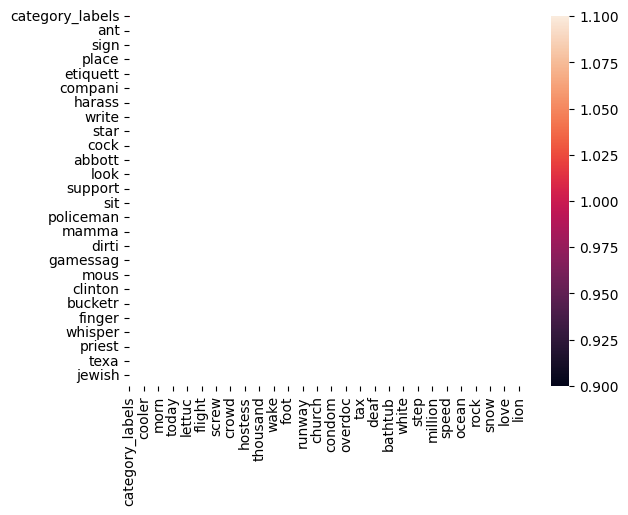

In [77]:
import seaborn as sns

sns.heatmap(df_with_top_words.corr())

#### Split the data into training and testing sets

In [78]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_with_top_words.drop(['joke_cleaned', 'category', 'category_labels'], axis=1), df_with_top_words['category'], test_size=0.2, random_state=42)

#### Decision Tree Classifier

In [79]:
# Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier

# Create a DecisionTreeClassifier object
dt = DecisionTreeClassifier()

# Fit the model
dt.fit(X_train, y_train)

# Make predictions on the test data
y_pred = dt.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print('Accuracy: {:.2f}%'.format(accuracy*100))

Accuracy: 6.62%


#### Random Forest

In [80]:
# Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

# Create a RandomForestClassifier object
rf = RandomForestClassifier()

# Fit the model
rf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print('Accuracy: {:.2f}%'.format(accuracy*100))

Accuracy: 6.62%
